# Склейка панорамы. Домашнее задание № 2

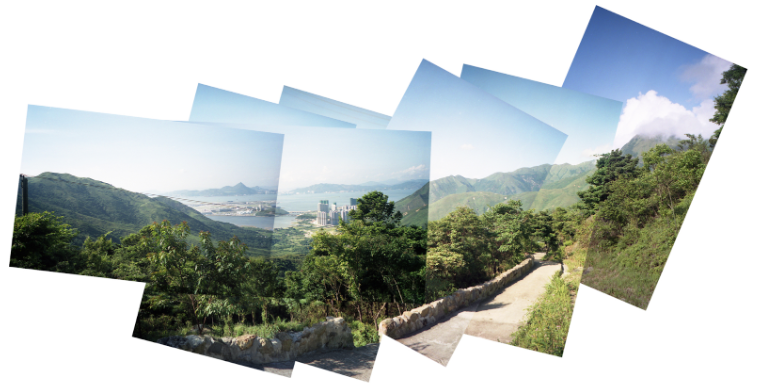

1. Нафотать какую-нибудь сцену с большим перекрытием между кадрами. (Только надо поворачивать, а не смещать камеру. Иначе эффект параллакса даст о себе знать)
2. Сматчить фото между собой. Визуализировать матчи на картинках и проверять фото на адекватность их матчей между собой. 
3. Затем нужно посчитать homography и склеить фото между собой.
4. https://github.com/ndvinh98/Panorama/blob/master/stitch.py

```python
(matches, H, status) = M
		result = cv2.warpPerspective(imageA, H,
			(imageA.shape[1] + imageB.shape[1], imageA.shape[0]))
		result[0:imageB.shape[0], 0:imageB.shape[1]] = imageB
```
Главная идея вот в этих строчках ниже. Посчитать homography между двумя картинками, а потом просто наложить их друг на друга. 

```python
(H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC,
				reprojThresh)
```

4. * Задача со звёздочкой. Заменить SIFT-овые ключевые точки на [SuperPoint](https://github.com/rpautrat/SuperPoint) или [SiLK](https://github.com/facebookresearch/silk). Нужно поменять только код вычисления ключевых точек.


In [ ]:
# # Зависимости
# ! pip install opencv-python
# ! pip install scikit-image
# ! pip install matplotlib
# ! pip install scipy

In [1]:
from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import logging
import skimage.io as io

# Зависимости задачи со звёздочкой
# import torch
# from common import get_model, load_images, SILK_MATCHER
# from silk.backbones.silk.silk import from_feature_coords_to_image_coords
# from silk.cli.image_pair_visualization import create_img_pair_visual, save_image


### Чтение данных

In [2]:
images_paths = list(Path('./hw_imgs').glob('./photo_*'))
# images_paths = list(Path('./imgs').glob('./image_*'))
images_paths = sorted(images_paths)
image_list = []
for image_path in images_paths:
    image = cv2.imread(image_path.as_posix())
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_list.append(image)

num_images = len(image_list)
print(num_images)

10


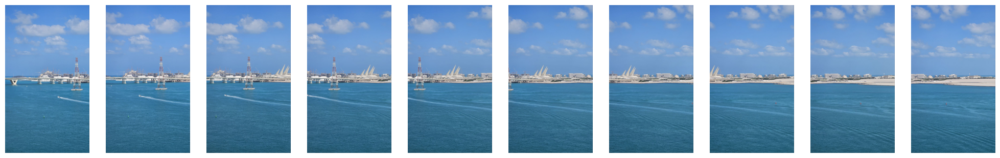

In [3]:
f, axarr = plt.subplots(1,num_images, figsize=(25,20))
for i in range(len(image_list)) :
    axarr[i].imshow(image_list[i])
    axarr[i].axis("off")
plt.show()

### Функции для :
1. evaluate_descriptor_for_image - извлечение ключевых точек и дескрипторов методом SIFT
2. match_keypoints - для сопоставления ключевых точек двух изображений, согласно ближайшим дескрипторам, используя метод k - ближайших соседей
3. draw_matches - для отрисовки сопоставленных ключевых точек в целях отладки

## Панорама с ключевыми точками из SIFT (40 балов)

In [87]:
def evaluate_descriptor_for_image(image : np.array, scale_factor: int = 1):
    # Создаем объект SIFT (Scale-Invariant Feature Transform) 
    # для обнаружения ключевых точек и вычисления дескрипторов
    SIFT = cv2.SIFT_create()

    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor != 1 :
        image = cv2.resize(image, (orig_w // scale_factor, orig_h // scale_factor))

    # Преобразуем изображение в оттенки серого, так как SIFT работает с монохромными изображениями
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SIFT
    keypoints, descriptors = SIFT.detectAndCompute(image, None)

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)

    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // scale_factor)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // scale_factor)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig, keypoints, descriptors
    
def match_keypoints(kpsA, kpsB, featuresA, featuresB, ratio=0.75, reprojThresh=4.0):

    # Создаем объект FlannBasedMatcher для поиска ближайших соседей между дескрипторами двух изображений
    flann = cv2.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))

    # Выполняем сопоставление с использованием k-NN (2 ближайших соседа для каждого дескриптора)
    matches = flann.knnMatch(featuresA, featuresB, k=2)

    # Инициализируем список для хранения "хороших" совпадений
    good = []

    # Проходим по каждому набору пар ближайших соседей (m - лучший матч, n - второй лучший)
    for i, (m, n) in enumerate(matches):
        # Если расстояние до ближайшего соседа значительно меньше, чем до второго (по критерию Лоу),
        # то добавляем этот матч в список хороших
        if m.distance < 0.5 * n.distance:
            good.append(m)

    # Преобразуем "хорошие" матчи в массив индексов (индексы соответствующих ключевых точек на изображениях A и B)
    matches = np.asarray([[m.trainIdx, m.queryIdx] for m in good], dtype=np.int32)

    # Если найдено хотя бы 4 совпадения, можно вычислить гомографию
    if len(matches) > 4:
        # Извлекаем координаты точек на двух изображениях, соответствующих матчам
        ptsA = np.float32([kpsA[i] for (_, i) in matches])
        ptsB = np.float32([kpsB[i] for (i, _) in matches])

        # Вычисляем матрицу гомографии с использованием алгоритма RANSAC
        (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, reprojThresh)

        # Возвращаем матчи, матрицу гомографии и статус каждой точки (успешное или неуспешное совпадение)
        return (matches, H, status)

    # Если недостаточно совпадений для вычисления гомографии, возвращаем None
    return None

def draw_matches(imageA, imageB, kpsA, kpsB, matches, status):
    # Извлекаем размеры двух изображений
    (hA, wA) = imageA.shape[:2]
    (hB, wB) = imageB.shape[:2]

    # Создаем пустое изображение для визуализации, которое объединяет два изображения по горизонтали
    vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")

    # Копируем изображение A в левую часть визуализации
    vis[0:hA, 0:wA] = imageA

    # Копируем изображение B в правую часть визуализации
    vis[0:hB, wA:] = imageB

    # Проходим по каждому совпадению и статусу (если статус равен 1, совпадение считается успешным)
    for ((trainIdx, queryIdx), s) in zip(matches, status):
        # Обрабатываем совпадение, если оно было успешно
        if s == 1:
            # Извлекаем координаты ключевых точек на изображении A
            ptA = (int(kpsA[queryIdx][0]), int(kpsA[queryIdx][1]))

            # Извлекаем координаты ключевых точек на изображении B, сдвинутые на ширину изображения A
            ptB = (int(kpsB[trainIdx][0]) + wA, int(kpsB[trainIdx][1]))

            # Рисуем линию, соединяющую соответствующие точки на двух изображениях
            cv2.line(vis, ptA, ptB, (0, 255, 0), 1)

    # Возвращаем изображение с визуализированными совпадениями
    return vis

### Опишем функции для устранения перекрытий и сглаживания границ

blending_mask - вычисляет маски для плавного перехода одного изображения в другое
panorama_blending - смешивает два изображения с заданными параметрами

*TODO: Реализовать в функции panorama_blending смешивание изображений с заданными масками*

In [7]:
def blending_mask(height, width, barrier, smoothing_window, left_biased=True):
    assert barrier < width
    mask = np.zeros((height, width))

    offset = int(smoothing_window / 2)
    try:
        if left_biased:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(1, 0, 2 * offset + 1).T, (height, 1)
            )
            mask[:, : barrier - offset] = 1
        else:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(0, 1, 2 * offset + 1).T, (height, 1)
            )
            mask[:, barrier + offset :] = 1
    except BaseException:
        if left_biased:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(1, 0, 2 * offset).T, (height, 1)
            )
            mask[:, : barrier - offset] = 1
        else:
            mask[:, barrier - offset : barrier + offset + 1] = np.tile(
                np.linspace(0, 1, 2 * offset).T, (height, 1)
            )
            mask[:, barrier + offset :] = 1

    return cv2.merge([mask, mask, mask])

def panorama_blending(dst_img_rz, src_img_warped, width_dst, side):
    """Given two aligned images @dst_img and @src_img_warped, and the @width_dst is width of dst_img
    before resize, that indicates where there is the discontinuity between the images,
    this function produce a smoothed transient in the overlapping.
    @smoothing_window is a parameter that determines the width of the transient
    left_biased is a flag that determines whether it is masked the left image,
    or the right one"""

    h, w, _ = dst_img_rz.shape
    smoothing_window = int(width_dst / 8)
    barrier = width_dst - int(smoothing_window / 2)
    mask1 = blending_mask(
        h, w, barrier, smoothing_window=smoothing_window, left_biased=True
    )
    mask2 = blending_mask(
        h, w, barrier, smoothing_window=smoothing_window, left_biased=False
    )

    if side == "left":
        dst_img_rz = cv2.flip(dst_img_rz, 1)
        src_img_warped = cv2.flip(src_img_warped, 1)
        dst_img_rz = dst_img_rz * mask1
        src_img_warped = src_img_warped * mask2
        pano = src_img_warped + dst_img_rz
        pano = cv2.flip(pano, 1)

    else:
        dst_img_rz = dst_img_rz * mask1
        src_img_warped = src_img_warped * mask2
        pano = src_img_warped + dst_img_rz


    return pano


### Опишем функции для нахождения и применения гомографии относительного правого изображения c учетом ключевых точек из метода SIFT

In [8]:
def crop(panorama, h_dst, conners):
    """crop panorama based on destination.
    @param panorama is the panorama
    @param h_dst is the hight of destination image
    @param conner is the tuple which containing 4 conners of warped image and
    4 conners of destination image"""
    # find max min of x,y coordinate
    [xmin, ymin] = np.int32(conners.min(axis=0).ravel() - 0.5)
    t = [-xmin, -ymin]
    conners = conners.astype(int)

    # conners[0][0][0] is the X coordinate of top-left point of warped image
    # If it has value<0, warp image is merged to the left side of destination image
    # otherwise is merged to the right side of destination image
    if conners[0][0][0] < 0:
        n = abs(-conners[1][0][0] + conners[0][0][0])
        panorama = panorama[t[1] : h_dst + t[1], n:, :]
    else:
        if conners[2][0][0] < conners[3][0][0]:
            panorama = panorama[t[1] : h_dst + t[1], 0 : conners[2][0][0], :]
        else:
            panorama = panorama[t[1] : h_dst + t[1], 0 : conners[3][0][0], :]
    return panorama


def warp_two_images(src_img, dst_img):

    # Вычисляем ключевые точки и дескрипторы для исходного изображения (src_img)
    _, keypoints_src, descriptors_src = evaluate_descriptor_for_image(src_img)
    # Вычисляем ключевые точки и дескрипторы для целевого изображения (dst_img)
    _, keypoints_dst, descriptors_dst = evaluate_descriptor_for_image(dst_img)
    # Печатаем количество ключевых точек и дескрипторов для отладки

    # print(keypoints_src.shape, descriptors_src.shape) ###-----PRINT-----###


    # Находим матрицу гомографии (H) и совпадающие ключевые точки между двумя изображениями
    (matches, H, _) = match_keypoints(keypoints_src, 
                                    keypoints_dst,                                
                                    descriptors_src, 
                                    descriptors_dst, 
                                    True)

    # get height and width of two images
    height_src, width_src = src_img.shape[:2]
    height_dst, width_dst = dst_img.shape[:2]

    # extract conners of two images: top-left, bottom-left, bottom-right, top-right
    pts1 = np.float32(
        [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
    ).reshape(-1, 1, 2)
    pts2 = np.float32(
        [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
    ).reshape(-1, 1, 2)

    try:
        # aply homography to conners of src_img
        pts1_ = cv2.perspectiveTransform(pts1, H)
        pts = np.concatenate((pts1_, pts2), axis=0)

        # find max min of x,y coordinate
        [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
        [_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
        t = [-xmin, -ymin]

        # top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
        # otherwise side=right
        # source image is merged to the left side or right side of destination image
        if pts[0][0][0] < 0:
            side = "left"
            width_pano = width_dst + t[0]
        else:
            width_pano = int(pts1_[3][0][0])
            side = "right"
        height_pano = ymax - ymin

        # Translation
        # https://stackoverflow.com/a/20355545
        Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
        src_img_warped = cv2.warpPerspective(
            src_img, Ht.dot(H), (width_pano, height_pano)
        )
        # generating size of dst_img_rz which has the same size as src_img_warped
        dst_img_rz = np.zeros((height_pano, width_pano, 3))
        if side == "left":
            dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
        else:
            dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

        # blending panorama
        pano = panorama_blending(dst_img_rz, src_img_warped, width_dst, side)

        # croping black region
        pano = crop(pano, height_dst, pts)
        return pano
    
    except BaseException:
        
        raise Exception("Please try again with another image set!")


### Отобразим ключевые точки метода SIFT

In [31]:
kp_orig_list = []
keypoints_list = []
descriptors_list = []
for image in image_list :
    kp_orig, keypoints, descriptors = evaluate_descriptor_for_image(image)
    kp_orig_list.append(kp_orig)
    keypoints_list.append(keypoints)
    descriptors_list.append(descriptors)
    print('kp_orig length: ', len(kp_orig), ',' 
          'keypoints shape: ', keypoints.shape, ',' 
          'descriptors shape: ', descriptors.shape,)
    print('--------------------------')
keypoints[:10, :]

kp_orig length:  1118 ,keypoints shape:  (1118, 2) ,descriptors shape:  (1118, 128)
--------------------------
kp_orig length:  1272 ,keypoints shape:  (1272, 2) ,descriptors shape:  (1272, 128)
--------------------------
kp_orig length:  1408 ,keypoints shape:  (1408, 2) ,descriptors shape:  (1408, 128)
--------------------------
kp_orig length:  1437 ,keypoints shape:  (1437, 2) ,descriptors shape:  (1437, 128)
--------------------------
kp_orig length:  1383 ,keypoints shape:  (1383, 2) ,descriptors shape:  (1383, 128)
--------------------------
kp_orig length:  1228 ,keypoints shape:  (1228, 2) ,descriptors shape:  (1228, 128)
--------------------------
kp_orig length:  1071 ,keypoints shape:  (1071, 2) ,descriptors shape:  (1071, 128)
--------------------------
kp_orig length:  968 ,keypoints shape:  (968, 2) ,descriptors shape:  (968, 128)
--------------------------
kp_orig length:  1034 ,keypoints shape:  (1034, 2) ,descriptors shape:  (1034, 128)
--------------------------
kp_o

array([[   2, 1075],
       [   3, 1264],
       [   6, 1110],
       [   6,  663],
       [   6,  668],
       [   8,  640],
       [   8, 1247],
       [   8, 1247],
       [   9,  650],
       [   9,  666]])

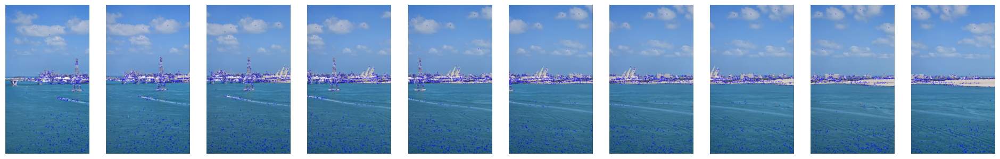

In [49]:
f, axarr = plt.subplots(1, 10, figsize=(24,70))
for i, image in enumerate(image_list):
    output_image = cv2.drawKeypoints(image, 
                                     kp_orig_list[i], 
                                     0, 
                                     (0, 0, 255),
                                     flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
    axarr[i].imshow(output_image)
    axarr[i].axis('off')
plt.show()

По хорошему, надо выкинуть ключевые точки, которые находятся на воде. Слишком динамическая природа что может привезти к проблемам с гомографией

### Сопоставим ближайшие по дескрипторам ключевые точки

In [58]:
print(keypoints_list[0].shape)
(matches, H, status) = match_keypoints(keypoints_list[0],                             
                                       keypoints_list[1],                        
                                       descriptors_list[0],                             
                                       descriptors_list[1]                            
                                       )

(1118, 2)


In [59]:
H

array([[ 1.00000000e+00, -4.31089207e-14, -1.39000000e+02],
       [ 1.24107029e-13,  1.00000000e+00, -7.00000000e+00],
       [ 1.90360621e-16, -8.99171115e-17,  1.00000000e+00]])

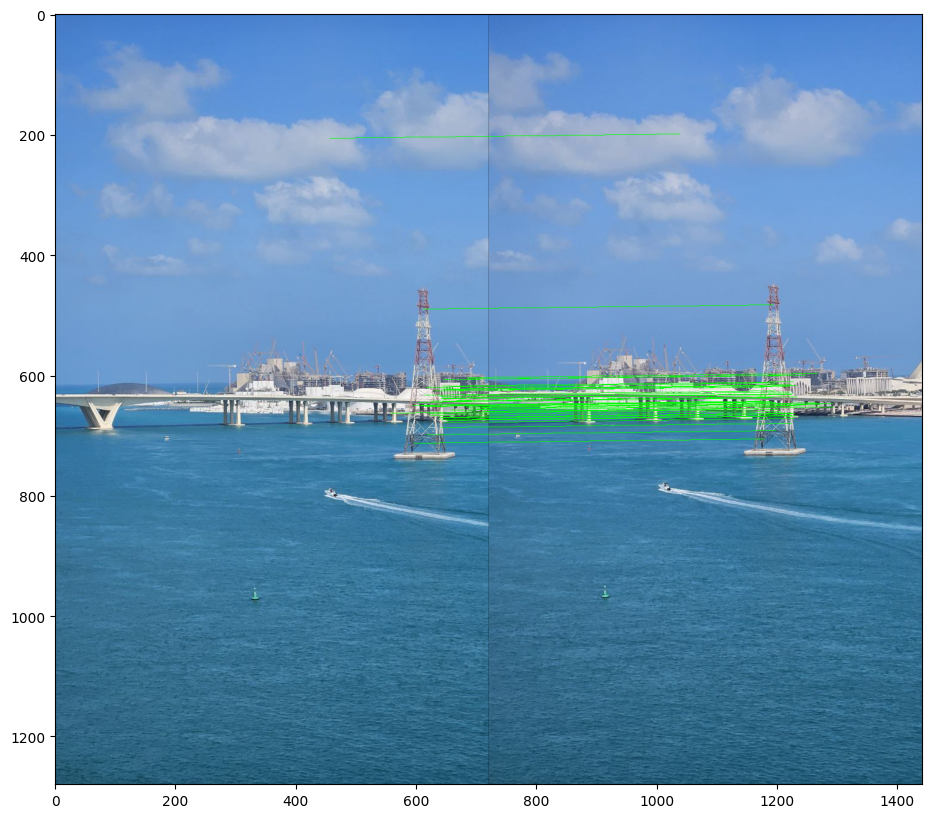

In [60]:
plt.figure(figsize=(20,10))
plt.imshow(draw_matches(image_list[0], 
                        image_list[1], 
                        keypoints_list[0], 
                        keypoints_list[1], 
                        matches, 
                        status))
plt.show()

Точки на водной поверхности сами исключились во время матчинга

### Посчитаем панораму для двух изображений, используя ключевые точки из SIFT

In [61]:
pano = warp_two_images(image_list[0], image_list[1])

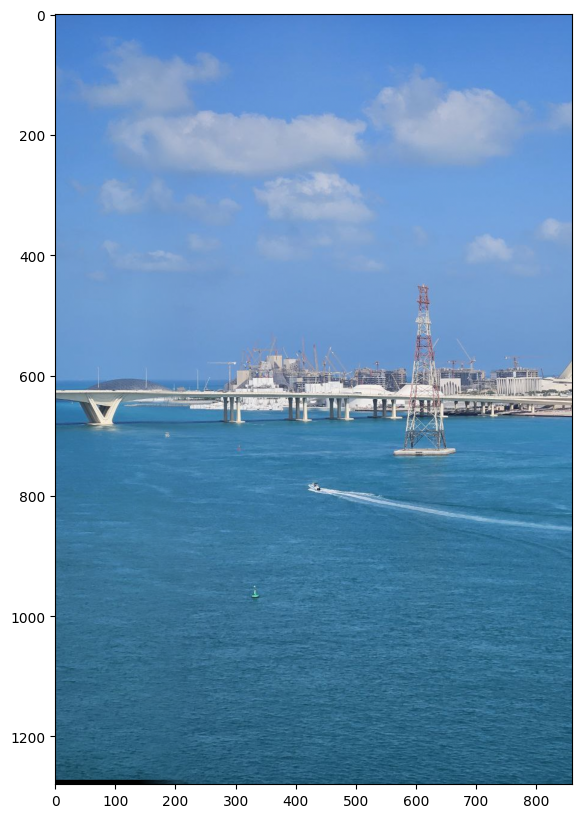

In [62]:
plt.figure(figsize=(10,10))
pano_normal = np.array(pano, dtype=float)/float(255)
plt.imshow(pano_normal)
plt.show()

### Напишем функцию для составления панорамы из множества изображений

In [63]:
def multi_stitching(list_images):
    """assume that the list_images was supplied in left-to-right order, choose middle image then
    divide the array into 2 sub-arrays, left-array and right-array. Stiching middle image with each
    image in 2 sub-arrays. @param list_images is The list which containing images, @param smoothing_window is
    the value of smoothy side after stitched, @param output is the folder which containing stitched image
    """
    n = int(len(list_images) / 2 + 0.5)
    left = list_images[:n]
    right = list_images[n - 1 :]
    right.reverse()
    while len(left) > 1:
        dst_img = left.pop()
        src_img = left.pop()
        left_pano = warp_two_images(src_img, dst_img)
        left_pano = left_pano.astype("uint8")
        left.append(left_pano)

    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        right_pano = warp_two_images(src_img, dst_img)
        right_pano = right_pano.astype("uint8")
        right.append(right_pano)

    # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
    if right_pano.shape[1] >= left_pano.shape[1]:
        fullpano = warp_two_images(left_pano, right_pano)
    else:
        fullpano = warp_two_images(right_pano, left_pano)
    return fullpano

### Построим панораму, используя ключевые точки из SIFT

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


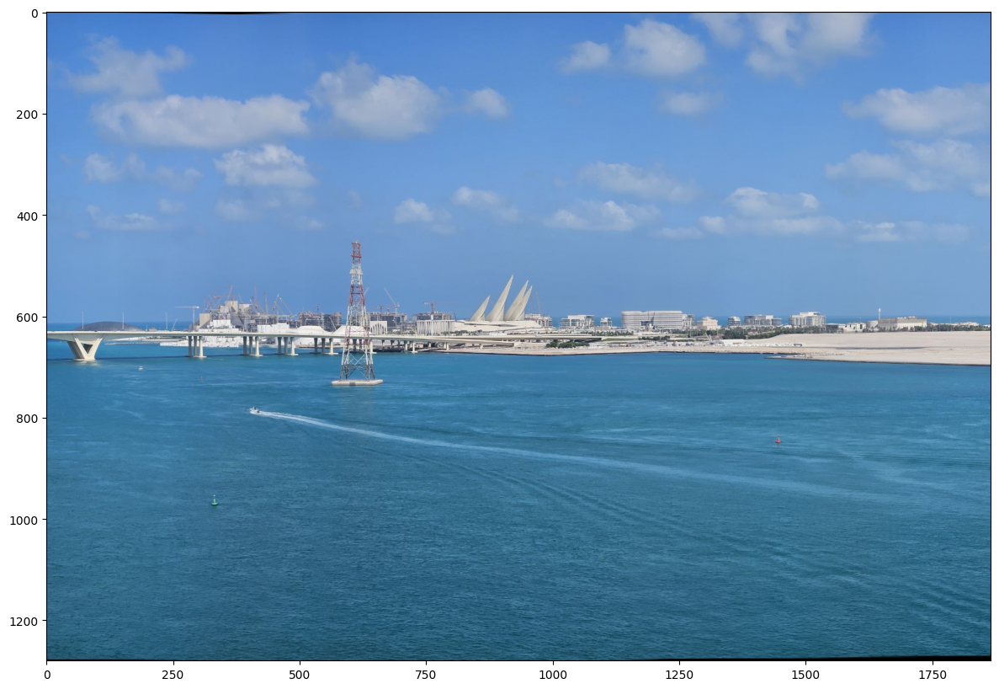

In [64]:
full_panorama = multi_stitching(image_list.copy())
full_panorama_normal = np.array(full_panorama, dtype=float)/float(255)
plt.figure(figsize=(15,10))
plt.imshow(full_panorama_normal)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000000000000002].


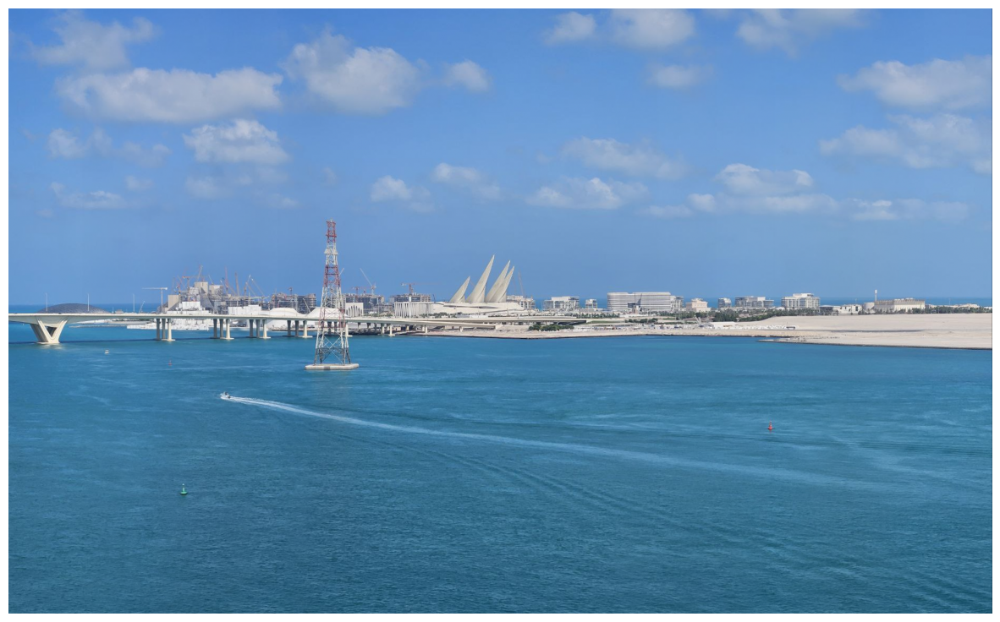

In [65]:
full_panorama_normal = full_panorama_normal[50:1200, :, :]
plt.figure(figsize=(15,10))
plt.axis("off")
plt.imshow(full_panorama_normal)

## Панорама с ключевыми точками из Silk (10 балов)

In [66]:
from transformers import AutoImageProcessor, SuperPointForKeypointDetection
import torch
from PIL import Image
import requests

In [67]:
images_paths = list(Path('./hw_imgs').glob('./photo_*'))
# images_paths = list(Path('./imgs').glob('./image_*'))
images_paths = sorted(images_paths)
image_list = []
for image_path in images_paths:
    image = cv2.imread(image_path.as_posix())
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_list.append(image)

num_images = len(image_list)

In [68]:
device = "cuda" if torch.cuda.is_available() else "cpu"
processor = AutoImageProcessor.from_pretrained("magic-leap-community/superpoint")
model = SuperPointForKeypointDetection.from_pretrained("magic-leap-community/superpoint").to(device)

In [69]:
image = image_list[0]

image_sizes = [image.shape[:2]]
print(image_sizes)

image = cv2.resize(image, dsize=(640, 480))

inputs = processor(image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model(**inputs)


kpts = outputs.keypoints.cpu().numpy()[0]
sc = outputs.scores.cpu().numpy()[0]

[(1280, 721)]


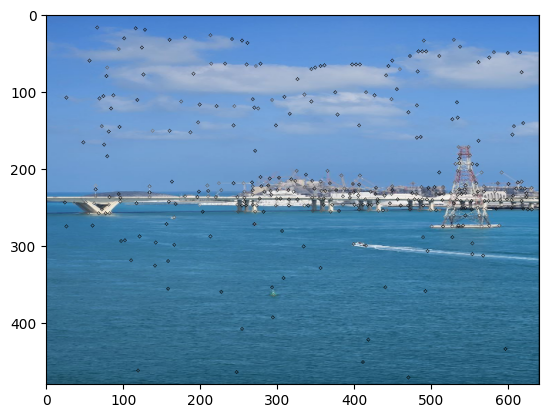

In [70]:
plt.figure()
for kp, score in zip(kpts, sc):
    keypoint_x, keypoint_y = int(kp[0].item()), int(kp[1].item())
    color = tuple([score.item() * 255] * 3)
    image = cv2.circle(image, (keypoint_x, keypoint_y), 2, color)
plt.imshow(image)

In [71]:
def evaluate_descriptor_for_image_superpoint(image : np.array, scale_factor: int = 1):


    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor != 1 :
        image = cv2.resize(image, (orig_w // scale_factor, orig_h // scale_factor))

    # подогнали под модель 
    image = cv2.resize(image, dsize=(640, 480))

    inputs = processor(image, return_tensors="pt").to(device)

    outputs = model(**inputs)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SuperPoint
    keypoints, descriptors, scores = outputs.keypoints, outputs.descriptors, outputs.scores

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    # keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)
    # keypoint_x, keypoint_y = int(keypoint[0].item()), int(keypoint[1].item())

    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // scale_factor)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // scale_factor)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig.cpu().numpy()[0], keypoints.cpu().numpy()[0], descriptors.cpu().detach().numpy()[0], scores.cpu().detach().numpy()[0]

In [72]:
def evaluate_descriptor_for_image_superpoint2(image : np.array, scale_factor: int = 1):


    # Извлекаем исходную высоту, ширину изображения и количество цветовых каналов
    orig_h, orig_w, _ = image.shape

    # Если задан масштабный коэффициент, изменяем размер изображения
    if scale_factor != 1 :
        image = cv2.resize(image, (orig_w // scale_factor, orig_h // scale_factor))

    inputs = processor(image, return_tensors="pt")

    outputs = model(**inputs)

    # Обнаруживаем ключевые точки и вычисляем дескрипторы с помощью SuperPoint
    keypoints, descriptors, scores = outputs.keypoints, outputs.descriptors, outputs.scores

    # Сохраняем исходные ключевые точки для последующего рисования
    keypoints_orig = keypoints

    # Преобразуем ключевые точки в массив numpy для удобства дальнейших вычислений
    # keypoints = np.asarray([[*kp.pt] for kp in keypoints], dtype=np.int32)
    # keypoint_x, keypoint_y = int(keypoint[0].item()), int(keypoint[1].item())

    # Масштабируем ключевые точки обратно в исходные размеры изображения
    keypoints[:, 0] = (keypoints[:, 0] / (orig_w // scale_factor)) * orig_w
    keypoints[:, 1] = (keypoints[:, 1] / (orig_h // scale_factor)) * orig_h

    # Возвращаем исходные ключевые точки, масштабированные ключевые точки и дескрипторы
    return keypoints_orig.numpy()[0], keypoints.numpy()[0], descriptors.detach().numpy()[0], scores.detach().numpy()[0]

In [73]:
def warp_two_images_superpoint(src_img, dst_img):
    # Вычисляем ключевые точки и дескрипторы для исходного изображения (src_img)
    _, keypoints_src, descriptors_src, _ = evaluate_descriptor_for_image_superpoint(src_img)
    # Вычисляем ключевые точки и дескрипторы для целевого изображения (dst_img)
    _, keypoints_dst, descriptors_dst, _ = evaluate_descriptor_for_image_superpoint(dst_img)

    # Находим матрицу гомографии (H) и совпадающие ключевые точки между двумя изображениями
    (matches, H, _) = match_keypoints(keypoints_src, 
                                    keypoints_dst,                                
                                    descriptors_src, 
                                    descriptors_dst, 
                                    True)
    
    src_img = cv2.resize(src_img, dsize=(640,480))
    dst_img = cv2.resize(dst_img, dsize=(640,480))

    # get height and width of two images
    height_src, width_src = src_img.shape[:2]
    height_dst, width_dst = dst_img.shape[:2]

    # extract conners of two images: top-left, bottom-left, bottom-right, top-right
    pts1 = np.float32(
        [[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]
    ).reshape(-1, 1, 2)
    pts2 = np.float32(
        [[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]
    ).reshape(-1, 1, 2)

    try:
        # aply homography to conners of src_img
        pts1_ = cv2.perspectiveTransform(pts1, H)
        pts = np.concatenate((pts1_, pts2), axis=0)

        # find max min of x,y coordinate
        [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
        t = [-xmin, -ymin]

        # top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
        # otherwise side=right
        # source image is merged to the left side or right side of destination image
        if pts[0][0][0] < 0:
            side = "left"
            width_pano = width_dst + t[0]
        else:
            width_pano = int(xmax)
            # width_pano = int(pts1_[3][0][0])
            side = "right"
        height_pano = ymax - ymin

        # Translation
        # https://stackoverflow.com/a/20355545
        Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
        src_img_warped = cv2.warpPerspective(src_img, Ht.dot(H), (width_pano, height_pano))
        # generating size of dst_img_rz which has the same size as src_img_warped
        dst_img_rz = np.zeros((height_pano, width_pano, 3))
        if side == "left":
            dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
        else:
            dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

        # blending panorama
        pano = panorama_blending(dst_img_rz, src_img_warped, width_dst, side)

        # croping black region
        pano = crop(pano, height_dst, pts)
        return pano
    
    except BaseException:
        
        raise Exception("Please try again with another image set!")

In [83]:
def multi_stitching_superpoint(list_images):
    n = int(len(list_images) / 2 + 0.5) # +0.5
    left = list_images[:n]
    right = list_images[n-1:]
    right.reverse()
    while len(left) > 1:
        dst_img = left.pop()
        src_img = left.pop()
        left_pano = warp_two_images_superpoint(src_img, dst_img)
        left_pano = left_pano.astype("uint8")
        left.append(left_pano)

    while len(right) > 1:
        dst_img = right.pop()
        src_img = right.pop()
        right_pano = warp_two_images_superpoint(src_img, dst_img)
        right_pano = right_pano.astype("uint8")
        right.append(right_pano)

    # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
    if right_pano.shape[1] >= left_pano.shape[1]:
        fullpano = warp_two_images_superpoint(left_pano, right_pano)
    else:
        fullpano = warp_two_images_superpoint(right_pano, left_pano)
    return fullpano

In [75]:
def draw_matches_superpoint(imageA, imageB, kpsA, kpsB, matches, status):

    imageA = cv2.resize(imageA, dsize=(640,480))
    imageB = cv2.resize(imageB, dsize=(640,480))
    
    # Извлекаем размеры двух изображений
    (hA, wA) = imageA.shape[:2]
    (hB, wB) = imageB.shape[:2]

    print(imageA.shape, imageB.shape)

    # Создаем пустое изображение для визуализации, которое объединяет два изображения по горизонтали
    vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")

    # Копируем изображение A в левую часть визуализации
    vis[0:hA, 0:wA] = imageA

    # Копируем изображение B в правую часть визуализации
    vis[0:hB, wA:] = imageB

    # Проходим по каждому совпадению и статусу (если статус равен 1, совпадение считается успешным)
    for ((indA, indB), s) in zip(matches, status):
        # Обрабатываем совпадение, если оно было успешно
        if s == 1:
            # Извлекаем координаты ключевых точек на изображении A
            ptA = (int(kpsA[indB][0]), int(kpsA[indB][1]))

            # Извлекаем координаты ключевых точек на изображении B, сдвинутые на ширину изображения A
            ptB = (int(kpsB[indA][0]) + wA, int(kpsB[indA][1]))

            # Рисуем линию, соединяющую соответствующие точки на двух изображениях
            cv2.line(vis, ptA, ptB, (0, 255, 0), 1)

    # Возвращаем изображение с визуализированными совпадениями
    return vis

In [76]:
kp_orig_list = []
keypoints_list = []
descriptors_list = []
scores_list = []
for image in image_list :
    kp_orig, keypoints, descriptors, scores = evaluate_descriptor_for_image_superpoint(image)
    kp_orig_list.append(kp_orig)
    keypoints_list.append(keypoints)
    descriptors_list.append(descriptors)
    scores_list.append(scores)
    print('kp_orig length: ', len(kp_orig), ',' 
          'keypoints shape: ', keypoints.shape, ',' 
          'descriptors shape: ', descriptors.shape,
          'scores shape: ', scores.shape,)
    print('--------------------------')

kp_orig length:  378 ,keypoints shape:  (378, 2) ,descriptors shape:  (378, 256) scores shape:  (378,)
--------------------------
kp_orig length:  374 ,keypoints shape:  (374, 2) ,descriptors shape:  (374, 256) scores shape:  (374,)
--------------------------
kp_orig length:  379 ,keypoints shape:  (379, 2) ,descriptors shape:  (379, 256) scores shape:  (379,)
--------------------------
kp_orig length:  338 ,keypoints shape:  (338, 2) ,descriptors shape:  (338, 256) scores shape:  (338,)
--------------------------
kp_orig length:  315 ,keypoints shape:  (315, 2) ,descriptors shape:  (315, 256) scores shape:  (315,)
--------------------------
kp_orig length:  252 ,keypoints shape:  (252, 2) ,descriptors shape:  (252, 256) scores shape:  (252,)
--------------------------
kp_orig length:  237 ,keypoints shape:  (237, 2) ,descriptors shape:  (237, 256) scores shape:  (237,)
--------------------------
kp_orig length:  234 ,keypoints shape:  (234, 2) ,descriptors shape:  (234, 256) scores sh

<Figure size 640x480 with 0 Axes>

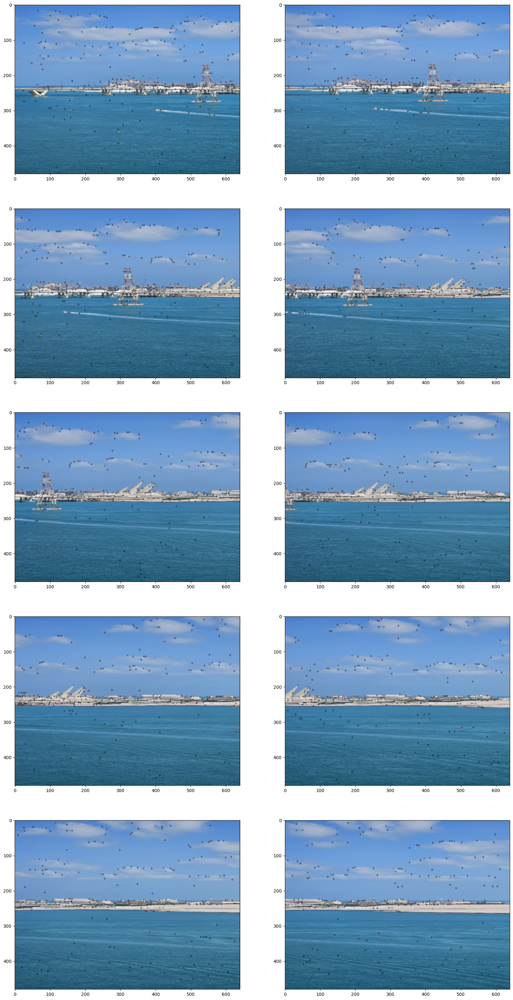

In [77]:
plt.figure()
fig, ax = plt.subplots(5,2,figsize=(20, 40))
for i, image in enumerate(image_list):

    image = cv2.resize(image, dsize=(640,480))
    kpts = keypoints_list[i]
    score = scores_list[i]

    for kp, sc in zip(kpts, score):
        keypoint_x, keypoint_y = int(kp[0]), int(kp[1])
        color = tuple([sc * 255] * 3)
        image = cv2.circle(image, (keypoint_x, keypoint_y), 2, color)
    
    ax[i//2, i%2].imshow(image)

plt.imshow(image)

In [78]:
(matches, H, status) = match_keypoints(keypoints_list[0],                             
                                       keypoints_list[1],                        
                                       descriptors_list[0],                             
                                       descriptors_list[1]                            
                                       )

(480, 640, 3) (480, 640, 3)


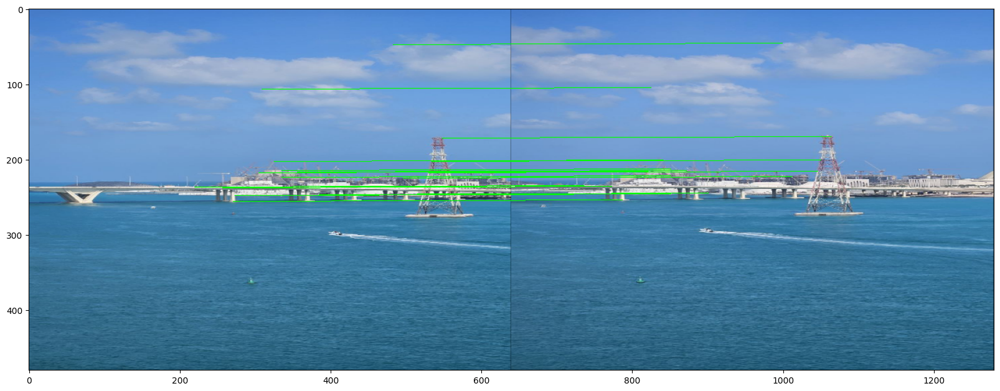

In [79]:
plt.figure(figsize=(20,20))
plt.imshow(draw_matches_superpoint(image_list[0], 
                        image_list[1], 
                        keypoints_list[0], 
                        keypoints_list[1], 
                        matches, 
                        status))
plt.show()

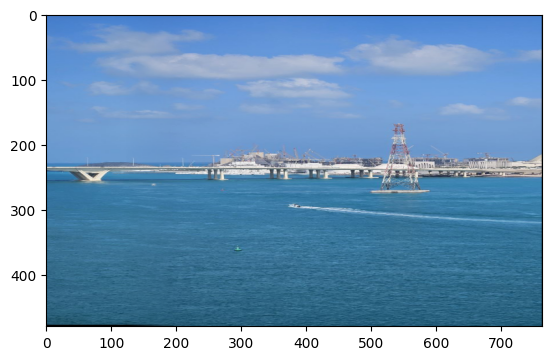

In [80]:
pano = warp_two_images_superpoint(image_list[0], image_list[1])
plt.imshow(pano.astype(np.uint8))

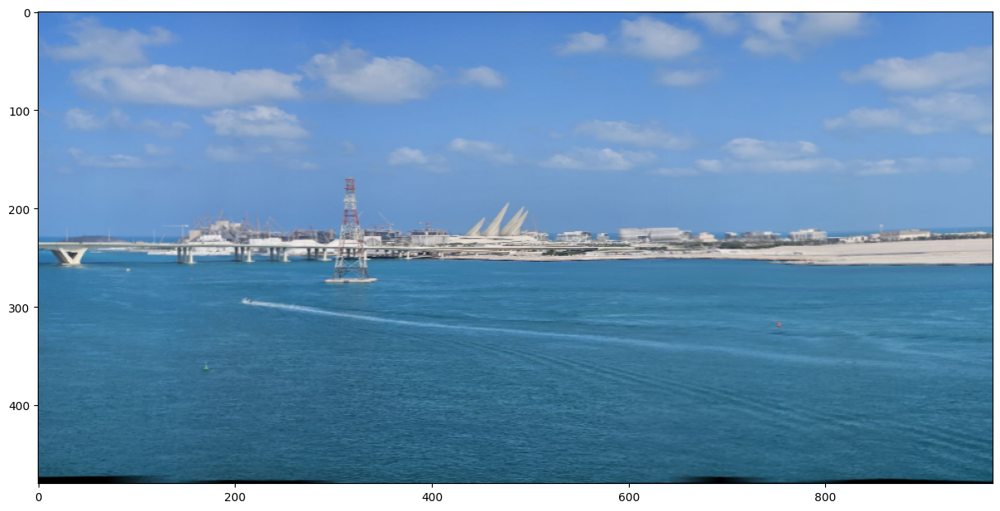

In [90]:
full_panorama = multi_stitching_superpoint(image_list.copy())
full_panorama_normal = np.array(full_panorama, dtype=float)/float(255)
plt.figure(figsize=(15,10))
plt.imshow(full_panorama_normal)
plt.show()
